In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data_path = "https://raw.githubusercontent.com/glenpaulsmith/IE0005Folder/main/open-meteo-23.23N77.45E495m.csv"

# create pandas dataframe
df = pd.read_csv(data_path, header = 2)
# remove spaces on the column
df.columns = df.columns.str.lstrip()
df.columns = df.columns.str.rstrip()

# print out sample dataset
print(len(df))
df.head()

210384


,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),precipitation (mm),rain (mm),cloud_cover (%),et0_fao_evapotranspiration (mm),wind_speed_10m (km/h),wind_direction_10m (°),direct_radiation (W/m²)
0,2000-01-01T00:00,13.4,57,5.2,0.0,0.0,0,0.04,10.3,61,0.0
1,2000-01-01T01:00,12.8,61,5.5,0.0,0.0,0,0.03,10.2,67,0.0
2,2000-01-01T02:00,12.2,65,5.8,0.0,0.0,0,0.03,9.9,71,0.0
3,2000-01-01T03:00,11.7,68,5.9,0.0,0.0,0,0.02,8.9,69,0.0
4,2000-01-01T04:00,11.2,71,6.1,0.0,0.0,0,0.02,9.0,67,0.0


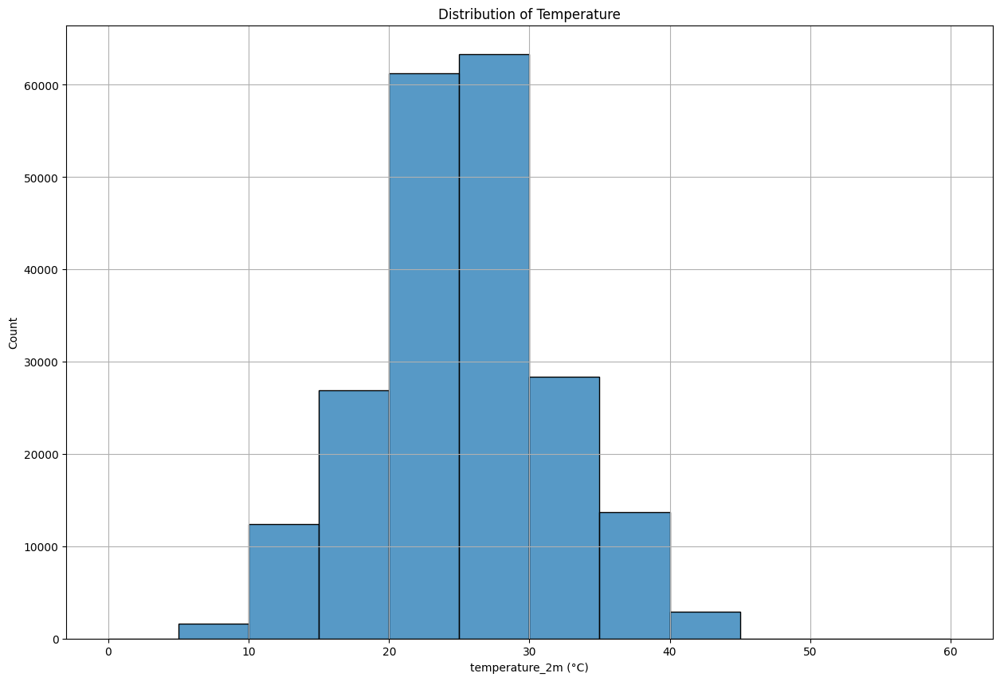

In [ ]:
# plot to see the temperature varience
plt.figure(figsize=(15, 10))
sns.histplot(df['temperature_2m (°C)'],bins=[i for i in range(0,61,5)], kde=False)
plt.title("Distribution of Temperature")
plt.grid()
plt.show()

In [ ]:
# set data index as datetime column
df.index = pd.to_datetime(df.time)

# filter the columns by only the required_columns
required_cols = ['temperature_2m (°C)', 'relative_humidity_2m (%)', 'dew_point_2m (°C)', 'precipitation (mm)', 'rain (mm)','cloud_cover (%)','et0_fao_evapotranspiration (mm)', 'wind_speed_10m (km/h)', 'wind_direction_10m (°)', 'direct_radiation (W/m²)']
df = df[required_cols]
df.head()



,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),precipitation (mm),rain (mm),cloud_cover (%),et0_fao_evapotranspiration (mm),wind_speed_10m (km/h),wind_direction_10m (°),direct_radiation (W/m²)
time,,,,,,,,,,
2000-01-01 00:00:00,13.4,57,5.2,0.0,0.0,0,0.04,10.3,61,0.0
2000-01-01 01:00:00,12.8,61,5.5,0.0,0.0,0,0.03,10.2,67,0.0
2000-01-01 02:00:00,12.2,65,5.8,0.0,0.0,0,0.03,9.9,71,0.0
2000-01-01 03:00:00,11.7,68,5.9,0.0,0.0,0,0.02,8.9,69,0.0
2000-01-01 04:00:00,11.2,71,6.1,0.0,0.0,0,0.02,9.0,67,0.0


In [ ]:
Temperature_Mean=df['temperature_2m (°C)'].resample('D').mean()
Temperature_Mean.name='Mean Temperature'
Temperature_Mean.head()

time
2000-01-01    16.925000
2000-01-02    16.529167
2000-01-03    15.708333
2000-01-04    15.512500
2000-01-05    15.783333
Freq: D, Name: Mean Temperature, dtype: float64

In [ ]:
required_cols = ['temperature_2m (°C)', 'relative_humidity_2m (%)', 'dew_point_2m (°C)', 'precipitation (mm)', 'rain (mm)','cloud_cover (%)','et0_fao_evapotranspiration (mm)', 'wind_speed_10m (km/h)', 'wind_direction_10m (°)', 'direct_radiation (W/m²)']
df = df[required_cols]
df.head()

,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),precipitation (mm),rain (mm),cloud_cover (%),et0_fao_evapotranspiration (mm),wind_speed_10m (km/h),wind_direction_10m (°),direct_radiation (W/m²)
time,,,,,,,,,,
2000-01-01 00:00:00,13.4,57,5.2,0.0,0.0,0,0.04,10.3,61,0.0
2000-01-01 01:00:00,12.8,61,5.5,0.0,0.0,0,0.03,10.2,67,0.0
2000-01-01 02:00:00,12.2,65,5.8,0.0,0.0,0,0.03,9.9,71,0.0
2000-01-01 03:00:00,11.7,68,5.9,0.0,0.0,0,0.02,8.9,69,0.0
2000-01-01 04:00:00,11.2,71,6.1,0.0,0.0,0,0.02,9.0,67,0.0


In [ ]:
df_first=df.resample('D').first()
df_final=pd.merge(df_first,Temperature_Mean.drop(columns='time'),on='time',how='left')
df_final.head()

,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),precipitation (mm),rain (mm),cloud_cover (%),et0_fao_evapotranspiration (mm),wind_speed_10m (km/h),wind_direction_10m (°),direct_radiation (W/m²),Mean Temperature
time,,,,,,,,,,,
2000-01-01,13.4,57,5.2,0.0,0.0,0,0.04,10.3,61,0.0,16.925000
2000-01-02,13.5,56,4.9,0.0,0.0,0,0.04,10.0,60,0.0,16.529167
2000-01-03,12.6,55,3.9,0.0,0.0,0,0.04,9.1,56,0.0,15.708333
2000-01-04,11.4,56,3.0,0.0,0.0,0,0.03,7.9,60,0.0,15.512500
2000-01-05,12.0,54,2.9,0.0,0.0,0,0.03,7.8,77,0.0,15.783333


In [ ]:
df_final.describe()

,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),precipitation (mm),rain (mm),cloud_cover (%),et0_fao_evapotranspiration (mm),wind_speed_10m (km/h),wind_direction_10m (°),direct_radiation (W/m²),Mean Temperature
count,8766.000000,8766.000000,8766.000000,8766.000000,8766.000000,8766.000000,8766.000000,8766.000000,8766.000000,8766.0,8766.000000
mean,22.519119,62.554871,13.686847,0.121070,0.121070,23.387064,0.051737,10.100331,183.190965,0.0,25.295958
std,5.309856,23.774024,7.000406,0.705469,0.705469,31.409479,0.060116,3.955337,109.165241,0.0,5.149481
min,7.000000,12.000000,-7.500000,0.000000,0.000000,0.000000,0.000000,0.400000,2.000000,0.0,11.170833
25%,18.500000,44.000000,8.000000,0.000000,0.000000,0.000000,0.010000,7.600000,63.000000,0.0,21.867708
50%,23.500000,64.000000,12.600000,0.000000,0.000000,7.000000,0.030000,9.300000,227.000000,0.0,25.295833
75%,25.700000,84.750000,21.200000,0.000000,0.000000,35.000000,0.070000,12.100000,274.000000,0.0,28.198958
max,35.200000,100.000000,25.400000,23.000000,23.000000,100.000000,0.340000,28.400000,360.000000,0.0,38.479167


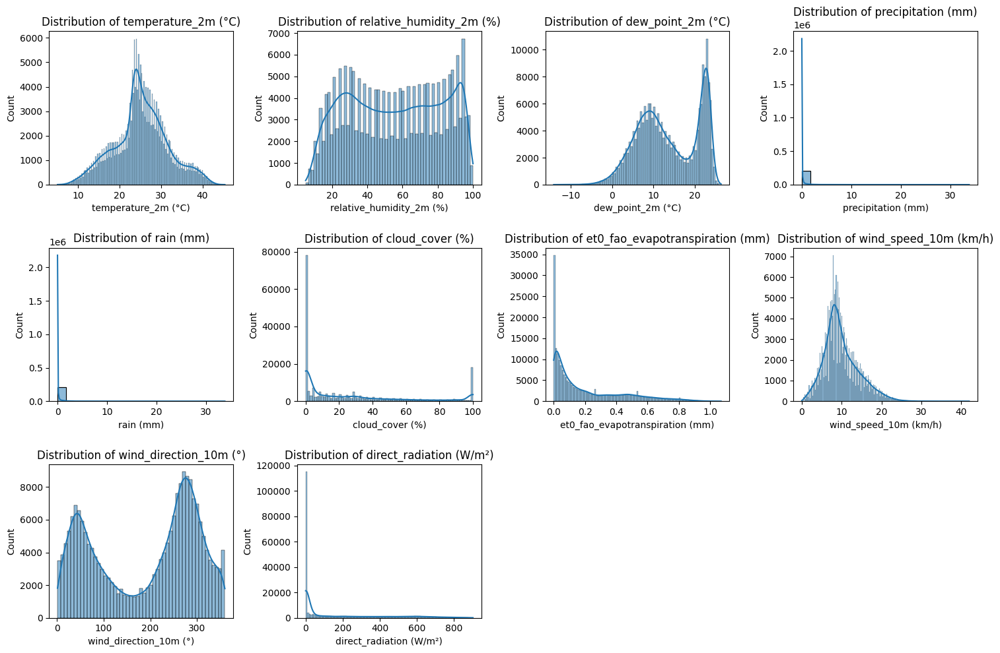

In [ ]:
# Distribution of each feature
plt.figure(figsize=(15, 10))
for i, column in enumerate(df.columns):
    plt.subplot(3, 4, i+1)
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()

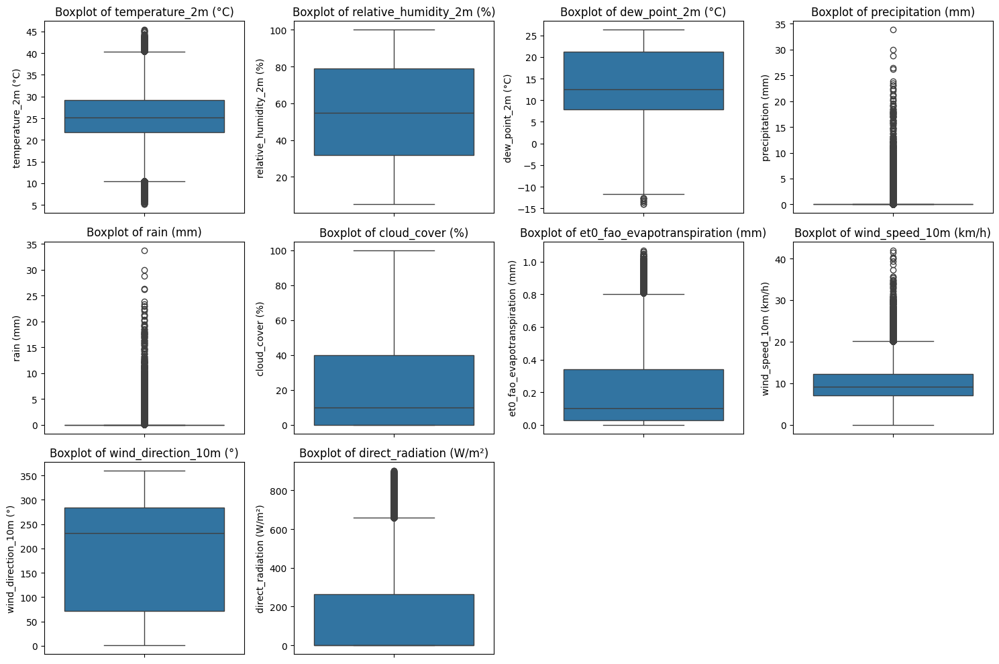

In [ ]:
# Boxplot for each feature
plt.figure(figsize=(15, 10))
for i, column in enumerate(df.columns):
    plt.subplot(3, 4, i+1)
    sns.boxplot(y=df[column])
    plt.title(f'Boxplot of {column}')
plt.tight_layout()
plt.show()


In [ ]:
# Outlier detection
outliers = {}
for column in df.columns:
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers[column] = df[(df[column] < lower_bound) | (df[column] > upper_bound)]

print("Outliers:")
for column, outlier_df in outliers.items():
    print(f"{column}: {len(outlier_df)} outliers")


Outliers:
temperature_2m (°C): 4225 outliers
relative_humidity_2m (%): 0 outliers
dew_point_2m (°C): 10 outliers
precipitation (mm): 28494 outliers
rain (mm): 28494 outliers
cloud_cover (%): 0 outliers
et0_fao_evapotranspiration (mm): 3626 outliers
wind_speed_10m (km/h): 5299 outliers
wind_direction_10m (°): 0 outliers
direct_radiation (W/m²): 10653 outliers


<Axes: >

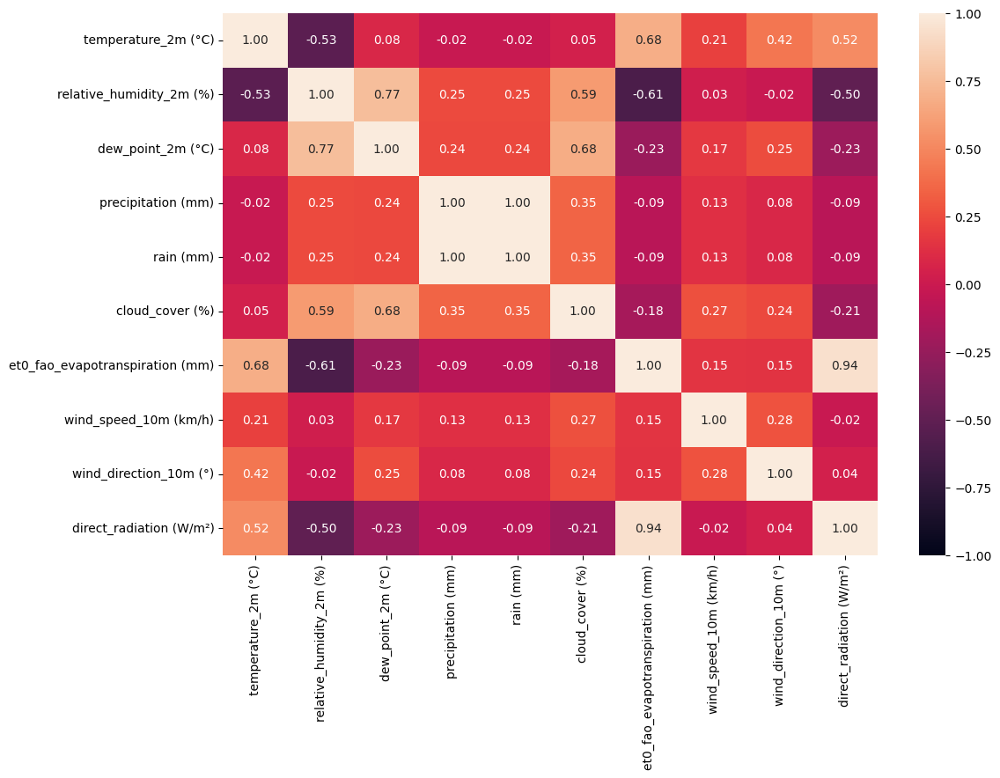

In [ ]:
f = plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

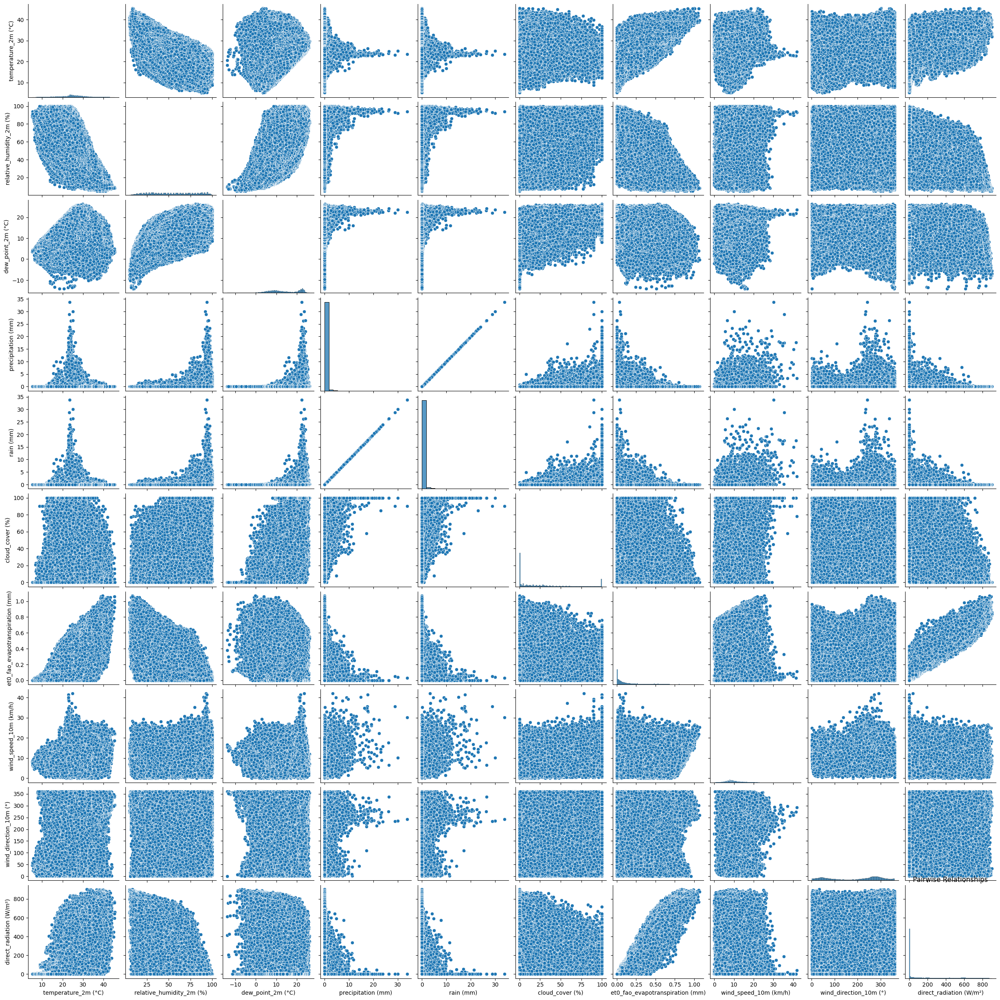

In [ ]:
# Pairplot for pairwise relationships
sns.pairplot(df)
plt.title('Pairwise Relationships')
plt.show()


In [ ]:
df_final.isna().sum()

temperature_2m (°C)                0
relative_humidity_2m (%)           0
dew_point_2m (°C)                  0
precipitation (mm)                 0
rain (mm)                          0
cloud_cover (%)                    0
et0_fao_evapotranspiration (mm)    0
wind_speed_10m (km/h)              0
wind_direction_10m (°)             0
direct_radiation (W/m²)            0
Mean Temperature                   0
dtype: int64

In [ ]:
#Linear Regression
# Extract Response and Predictors
y = pd.DataFrame(df_final["Mean Temperature"])
X = pd.DataFrame(df_final[["temperature_2m (°C)","relative_humidity_2m (%)","dew_point_2m (°C)","cloud_cover (%)","et0_fao_evapotranspiration (mm)","wind_speed_10m (km/h)","wind_direction_10m (°)"]])


In [ ]:
# Import train_test_split from sklearn
from sklearn.model_selection import train_test_split
import seaborn as sb
# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Check the sample sizes
print("Train Set :", y_train.shape, X_train.shape)
print("Test Set  :", y_test.shape, X_test.shape)

Train Set : (6574, 1) (6574, 7)
Test Set  : (2192, 1) (2192, 7)


<Axes: >

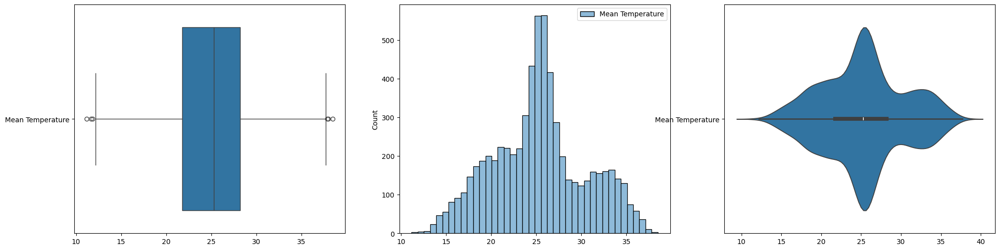

In [ ]:
# Draw the distribution of Response
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(data = y_train, orient = "h", ax = axes[0])
sb.histplot(data = y_train, ax = axes[1])
sb.violinplot(data = y_train, orient = "h", ax = axes[2])

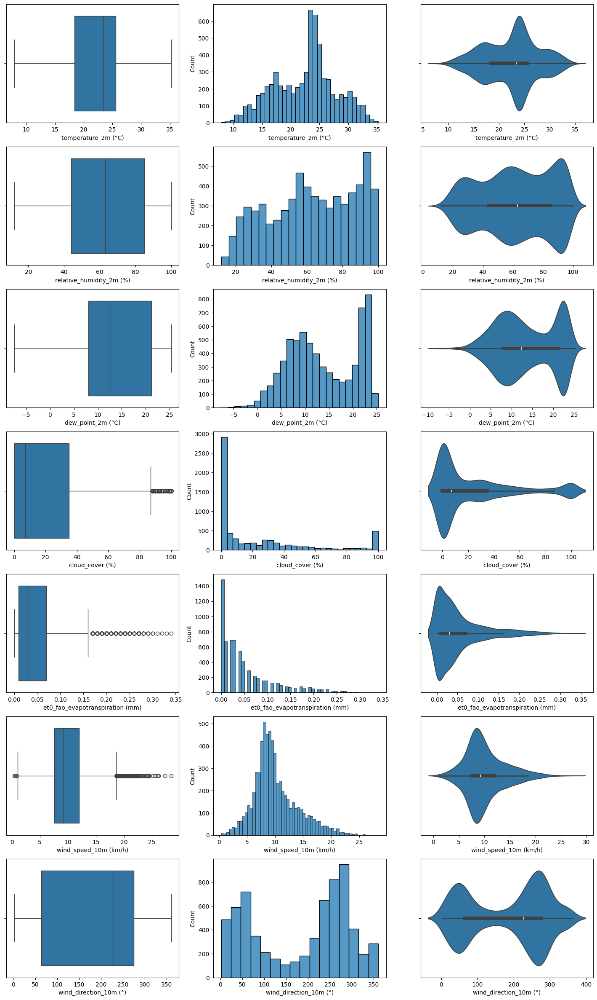

In [ ]:
# Draw the distributions of all Predictors
f, axes = plt.subplots(7, 3, figsize=(18, 30))

count = 0
for var in X_train:
    sb.boxplot(data = X_train[var], orient = "h", ax = axes[count,0])
    sb.histplot(data = X_train[var], ax = axes[count,1])
    sb.violinplot(data = X_train[var], orient = "h", ax = axes[count,2])
    count += 1

<Axes: >

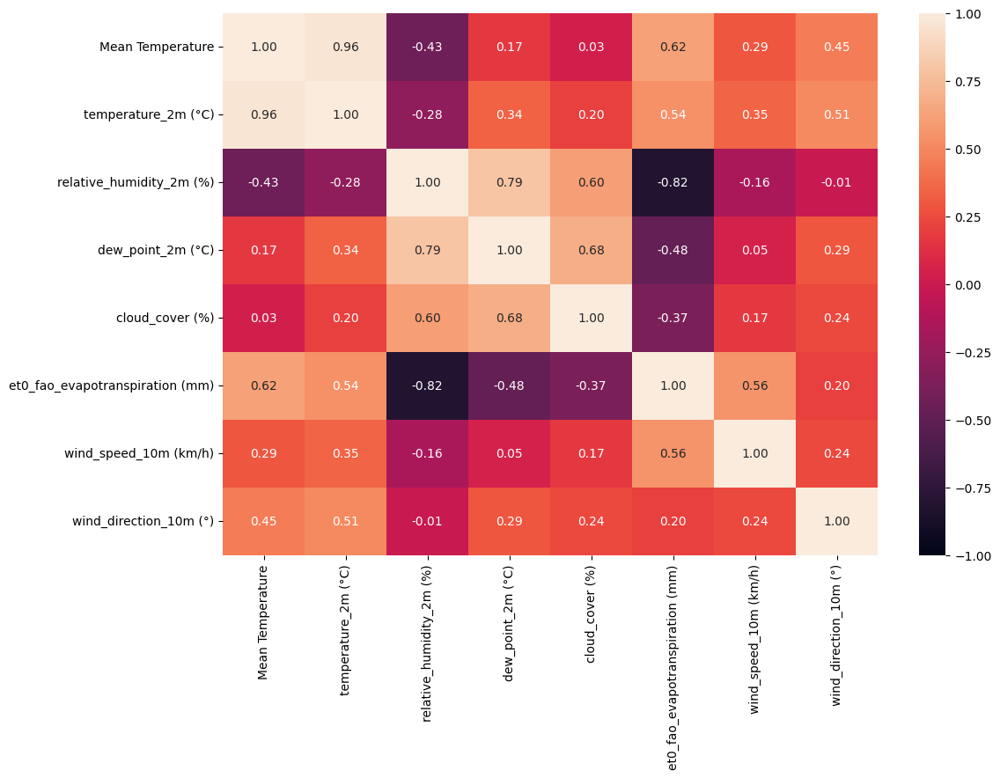

In [ ]:
# Correlation between Response and the Predictors
trainDF = pd.concat([y_train, X_train], axis = 1).reindex(y_train.index)

f = plt.figure(figsize=(12, 8))
sb.heatmap(trainDF.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

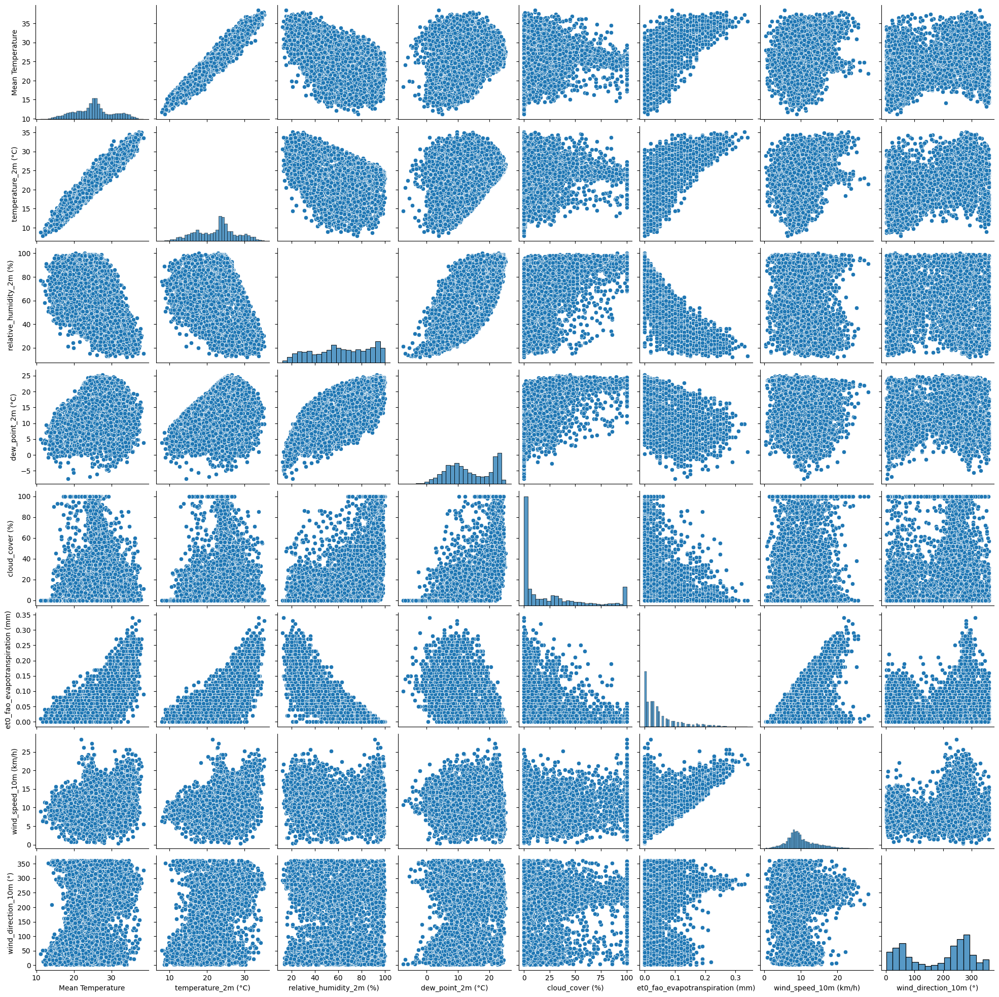

In [ ]:
# Relationship between Response and the Predictors
sb.pairplot(data = trainDF)

Intercept of Regression 	: b =  [4.31698531]
Coefficients of Regression 	: a =  [[ 1.05054307e+00  7.61602716e-04 -1.17791677e-01 -1.53289222e-02
  -4.61257240e+00 -3.81701958e-02 -7.21330875e-04]]

                        Predictors  Coefficients
0              temperature_2m (°C)      1.050543
1         relative_humidity_2m (%)      0.000762
2                dew_point_2m (°C)     -0.117792
3                  cloud_cover (%)     -0.015329
4  et0_fao_evapotranspiration (mm)     -4.612572
5            wind_speed_10m (km/h)     -0.038170
6           wind_direction_10m (°)     -0.000721



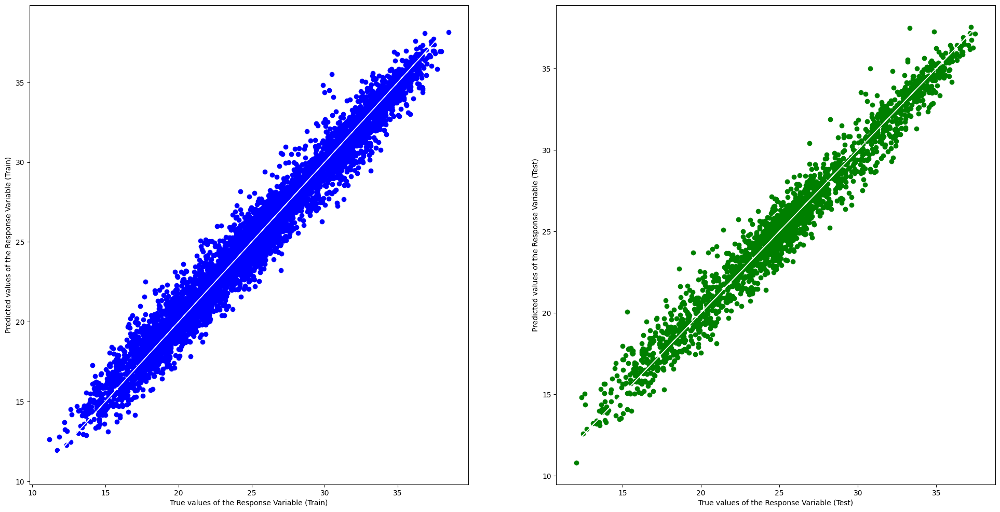

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.9638059427559996
Mean Squared Error (MSE) 	: 0.9548617454381143

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.9643860149434281
Mean Squared Error (MSE) 	: 0.9582181700144001



In [ ]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Print the Coefficients against Predictors
print(pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"]))
print()

# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train.to_numpy(), y_train.to_numpy(), 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test.to_numpy(), y_test.to_numpy(), 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

In [ ]:
df_D=df.resample('D').apply(np.mean)
df_D.head()

,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),precipitation (mm),rain (mm),cloud_cover (%),et0_fao_evapotranspiration (mm),wind_speed_10m (km/h),wind_direction_10m (°),direct_radiation (W/m²)
time,,,,,,,,,,
2000-01-01,16.925000,49.541667,5.337500,0.0,0.0,0.000000,0.154167,8.295833,61.625000,162.458333
2000-01-02,16.529167,50.125000,4.883333,0.0,0.0,0.000000,0.152500,8.170833,57.000000,163.041667
2000-01-03,15.708333,52.208333,4.779167,0.0,0.0,0.000000,0.153333,8.508333,79.666667,164.875000
2000-01-04,15.512500,48.125000,3.645833,0.0,0.0,0.000000,0.152500,7.904167,69.833333,165.666667
2000-01-05,15.783333,48.041667,3.920833,0.0,0.0,3.791667,0.151250,7.962500,69.125000,159.708333


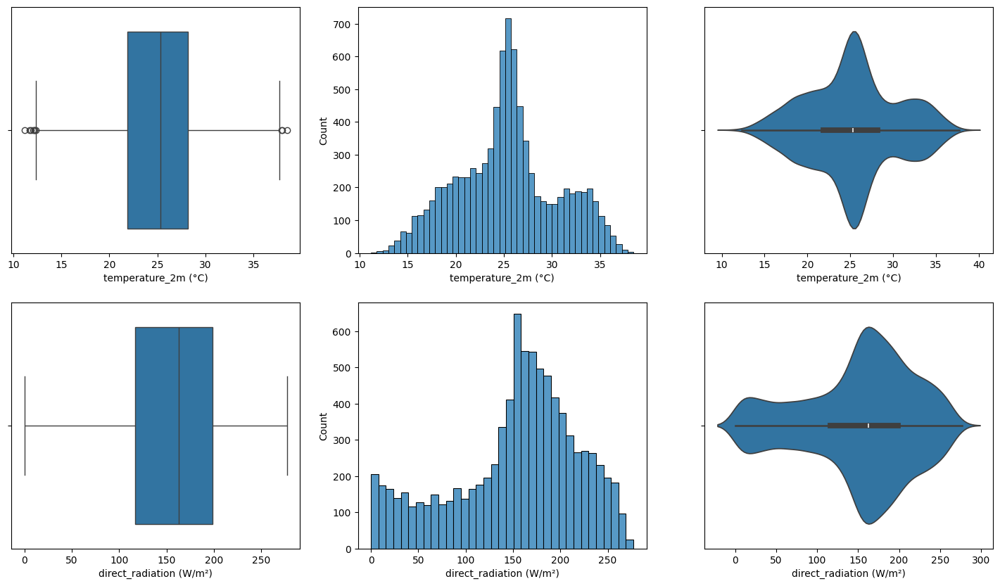

In [ ]:
# Draw the distributions
f, axes = plt.subplots(2, 3, figsize=(18, 10))
m=pd.DataFrame(df_D[["temperature_2m (°C)", "direct_radiation (W/m²)"]])
count = 0
for var in m:
    sb.boxplot(data = m[var], orient = "h", ax = axes[count,0])
    sb.histplot(data = m[var], ax = axes[count,1])
    sb.violinplot(data = m[var], orient = "h", ax = axes[count,2])
    count += 1

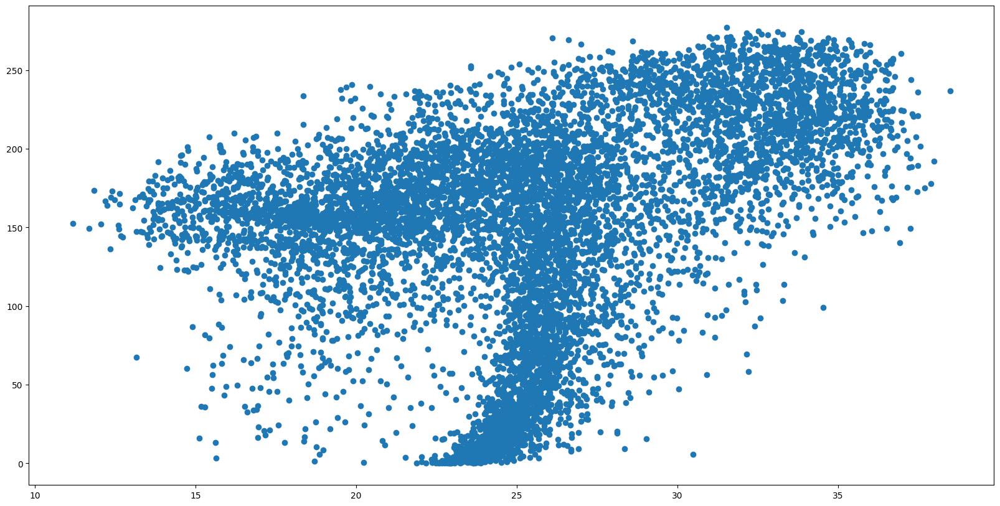

In [ ]:
#Clustering
# Extract the Features from the Data
X = pd.DataFrame(df_D[["temperature_2m (°C)", "direct_radiation (W/m²)"]])

# Plot the Raw Data on a 2D grid
f, axes = plt.subplots(1, 1, figsize=(20,10))
plt.scatter(x = "temperature_2m (°C)", y = "direct_radiation (W/m²)", data = X)

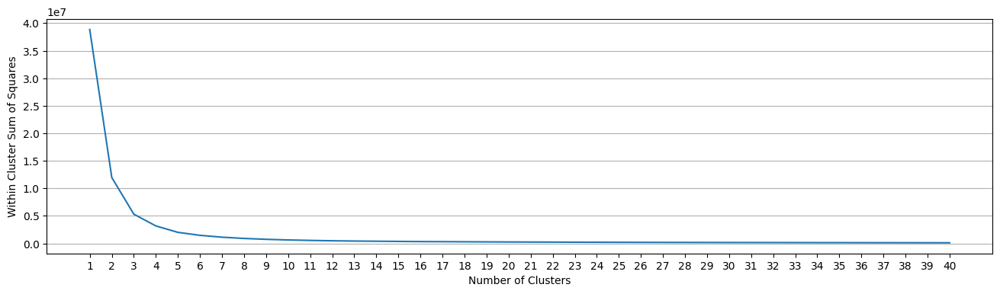

In [ ]:
# Import KMeans from sklearn.cluster
from sklearn.cluster import KMeans

# Extract the Features from the Data
X = pd.DataFrame(df_D[["temperature_2m (°C)","direct_radiation (W/m²)"]])

# Set the Initialization to KMeans++
init_algo = 'k-means++'

# Vary the Number of Clusters
min_clust = 1
max_clust = 40

# Compute Within Cluster Sum of Squares
within_ss = []
for num_clust in range(min_clust, max_clust+1):
    kmeans = KMeans(n_clusters = num_clust,        # number of clusters
                    init = init_algo,              # initialization algorithm
                    n_init = 5)                    # number of initializations
    kmeans.fit(X)
    within_ss.append(kmeans.inertia_)

# Plot Within SS vs Number of Clusters
f, axes = plt.subplots(1, 1, figsize=(16,4))
plt.plot(range(min_clust, max_clust+1), within_ss)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares')
plt.xticks(np.arange(min_clust, max_clust+1, 1.0))
plt.grid(which='major', axis='y')
plt.show()

Features 	Total 	Speed

Cluster 0:	22.38	161.23	
Cluster 1:	24.37	22.05	
Cluster 2:	31.04	239.95	
Cluster 3:	24.96	76.25	
Cluster 4:	26.46	195.8	
Cluster 5:	23.44	125.66	

Within Cluster Sum of Squares : 1475672.1975700539



<Axes: xlabel='Cluster', ylabel='count'>

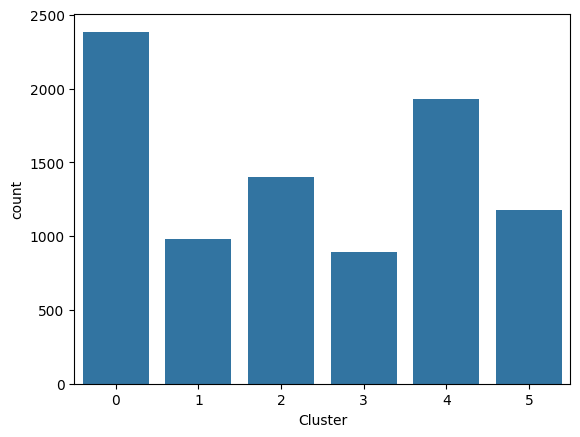

In [ ]:
# Set "optimal" Number of Clusters
num_clust = 6

# Set the Initialization to KMeans++
init_algo = 'k-means++'

# Create Clustering Model using KMeans
kmeans = KMeans(n_clusters = num_clust, init = init_algo, n_init = 20)

# Fit the Clustering Model on the Data
kmeans.fit(X)

# Print the Cluster Centers
print("Features", "\tTotal", "\tSpeed")
print()

for i, center in enumerate(kmeans.cluster_centers_):
    print("Cluster", i, end=":\t")
    for coord in center:
        print(round(coord, 2), end="\t")
    print()
print()

# Print the Within Cluster Sum of Squares
print("Within Cluster Sum of Squares :", kmeans.inertia_)
print()

# Predict the Cluster Labels
labels = kmeans.predict(X)

# Append Labels to the Data
X_labeled = X.copy()
X_labeled["Cluster"] = pd.Categorical(labels)

# Summary of the Cluster Labels
sb.countplot(x=X_labeled["Cluster"])

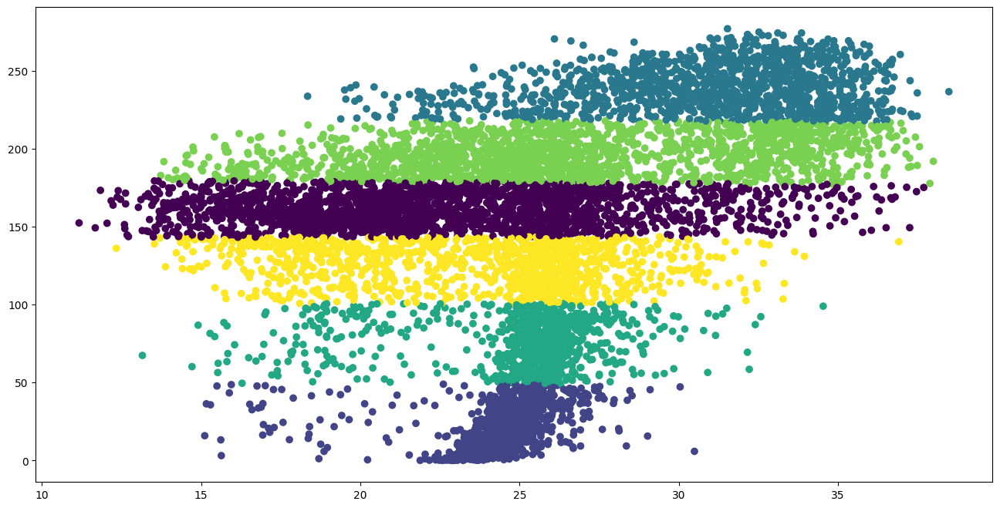

In [ ]:
# Visualize the Clusters in the Data
f, axes = plt.subplots(1, 1, figsize=(16,8))
plt.scatter(x = "temperature_2m (°C)", y ="direct_radiation (W/m²)", c = "Cluster", cmap = 'viridis', data = X_labeled)

<Axes: xlabel='direct_radiation (W/m²)', ylabel='Cluster'>

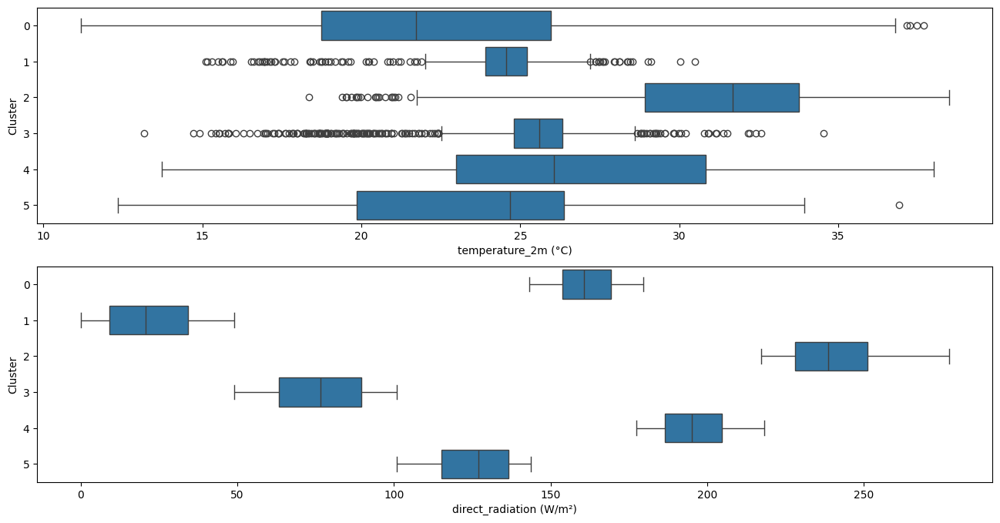

In [ ]:
# Boxplots for the Features against the Clusters
f, axes = plt.subplots(2, 1, figsize=(16,8))
sb.boxplot(x = 'temperature_2m (°C)', y = 'Cluster', data = X_labeled, ax = axes[0])
sb.boxplot(x = 'direct_radiation (W/m²)', y = 'Cluster', data = X_labeled, ax = axes[1])

<Axes: xlabel='Cluster'>

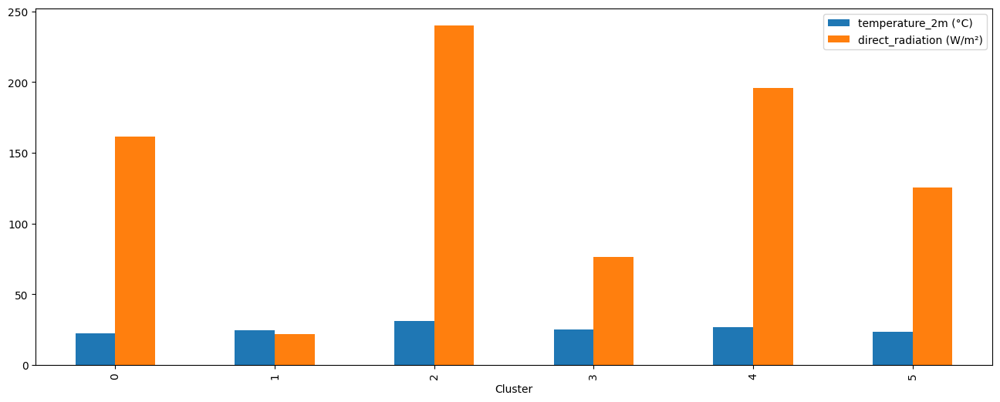

In [ ]:
# Average Behaviour of each Cluster
cluster_data = pd.DataFrame(X_labeled.groupby(by = "Cluster").mean())
cluster_data.plot.bar(figsize = (16,6))

In [ ]:
#LSTM
from sklearn.preprocessing import MinMaxScaler

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_final)
print(scaled_data)

# Define sequence length and features
sequence_length = 10  # Number of time steps in each sequence
num_features = len(df_final.columns)

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_data) - sequence_length):
    seq = scaled_data[i:i+sequence_length]
    label = scaled_data[i+sequence_length][10]  # '_tempm' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
train_x, test_x = sequences[:train_size], sequences[train_size:]
train_y, test_y = labels[:train_size], labels[train_size:]

print("Train X shape:", train_x.shape)
print("Train Y shape:", train_y.shape)
print("Test X shape:", test_x.shape)
print("Test Y shape:", test_y.shape)


[[0.22695035 0.51136364 0.38601824 ... 0.16480447 0.         0.21071102]
 [0.23049645 0.5        0.3768997  ... 0.16201117 0.         0.19621605]
 [0.19858156 0.48863636 0.34650456 ... 0.15083799 0.         0.16615807]
 ...
 [0.27304965 0.71590909 0.54103343 ... 0.12011173 0.         0.2493134 ]
 [0.28368794 0.82954545 0.60790274 ... 0.09497207 0.         0.27143729]
 [0.33333333 0.86363636 0.6656535  ... 0.22625698 0.         0.31705829]]
Train X shape: (7004, 10, 11)
Train Y shape: (7004,)
Test X shape: (1752, 10, 11)
Test Y shape: (1752,)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Create the LSTM model
model = Sequential()

# Add LSTM layers with dropout
model.add(LSTM(units=128, input_shape=(train_x.shape[1], train_x.shape[2]), return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(units=64, return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(units=32, return_sequences=False))
model.add(Dropout(0.2))

# Add a dense output layer
model.add(Dense(units=1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

keras.optimizers.Adam(
    learning_rate=0.001,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-07,
    amsgrad=False,
    weight_decay=None,
    clipnorm=None,
    clipvalue=None,
    global_clipnorm=None,
    use_ema=False,
    ema_momentum=0.99,
    ema_overwrite_frequency=None,
    name="adam",
    **kwargs
)

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 10, 128)           71680     
                                                                 
 dropout_3 (Dropout)         (None, 10, 128)           0         
                                                                 
 lstm_4 (LSTM)               (None, 10, 64)            49408     
                                                                 
 dropout_4 (Dropout)         (None, 10, 64)            0         
                                                                 
 lstm_5 (LSTM)               (None, 32)                12416     
                                                                 
 dropout_5 (Dropout)         (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                

In [ ]:
# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/IE0005/best_model_weights.h5', monitor='val_loss', save_best_only=True)

# Train the model
history = model.fit(
    train_x, train_y,
    epochs=100,
    batch_size=64,
    validation_split=0.2,  # Use part of the training data as validation
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/100
84/88 [===========================>..] - ETA: 0s - loss: 0.0203

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


88/88 [==============================] - 8s 26ms/step - loss: 0.0199 - val_loss: 0.0054
Epoch 2/100
88/88 [==============================] - 1s 10ms/step - loss: 0.0087 - val_loss: 0.0050
Epoch 3/100
88/88 [==============================] - 1s 9ms/step - loss: 0.0079 - val_loss: 0.0053
Epoch 4/100
88/88 [==============================] - 1s 10ms/step - loss: 0.0072 - val_loss: 0.0046
Epoch 5/100
88/88 [==============================] - 1s 9ms/step - loss: 0.0067 - val_loss: 0.0043
Epoch 6/100
88/88 [==============================] - 1s 9ms/step - loss: 0.0065 - val_loss: 0.0043
Epoch 7/100
88/88 [==============================] - 1s 11ms/step - loss: 0.0063 - val_loss: 0.0043
Epoch 8/100
88/88 [==============================] - 1s 13ms/step - loss: 0.0059 - val_loss: 0.0038
Epoch 9/100
88/88 [==============================] - 1s 14ms/step - loss: 0.0059 - val_loss: 0.0037
Epoch 10/100
88/88 [==============================] - 1s 12ms/step - loss: 0.0056 - val_loss: 0.0036
Epoch 11/100
8

In [ ]:
# Evaluate the best model on the test set
best_model = tf.keras.models.load_model('/content/drive/MyDrive/IE0005/best_model_weights.h5')
test_loss = best_model.evaluate(test_x, test_y)
print("Test Loss:", test_loss)

55/55 [==============================] - 1s 4ms/step - loss: 0.0011
Test Loss: 0.0011321960482746363


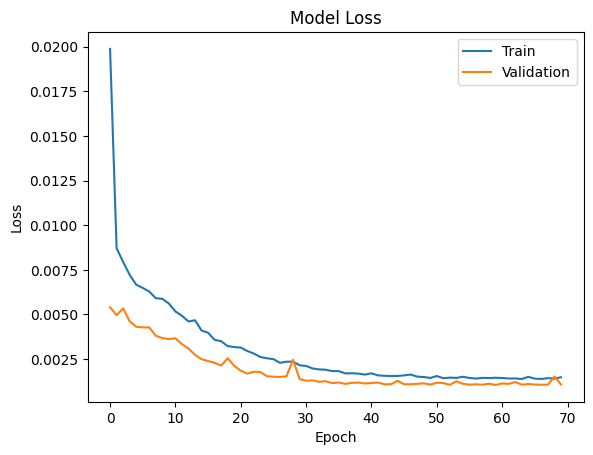

In [ ]:
# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Assuming you have trained the model and have the 'best_model' object
# Also, 'test_x' and 'test_y' should be available

# Predict temperatures using the trained model
predictions = best_model.predict(test_x)

# Calculate evaluation metrics
mae = mean_absolute_error(test_y, predictions)
mse = mean_squared_error(test_y, predictions)
rmse = np.sqrt(mse)
r = r2_score(test_y, predictions)

print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Explained Variance (R^2) \t:", r)

55/55 [==============================] - 1s 3ms/step
Mean Absolute Error (MAE): 0.025554228750166146
Mean Squared Error (MSE): 0.0011321961760432815
Root Mean Squared Error (RMSE): 0.03364812292005724
Explained Variance (R^2) 	: 0.9693567599930529


In [ ]:
# y_true values
test_y_copies = np.repeat(test_y.reshape(-1, 1), test_x.shape[-1], axis=-1)
true_temp = scaler.inverse_transform(test_y_copies)[:,10]

# predicted values
prediction = best_model.predict(test_x)
prediction_copies = np.repeat(prediction, 11, axis=-1)
predicted_temp = scaler.inverse_transform(prediction_copies)[:,10]

55/55 [==============================] - 0s 3ms/step


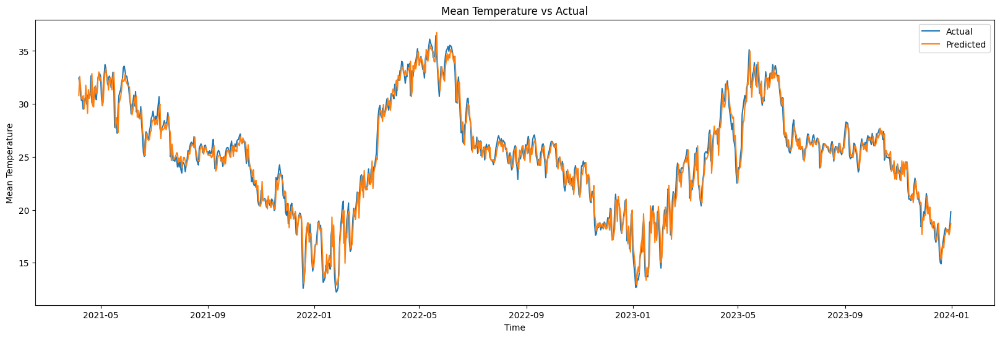

In [ ]:
# Plotting predicted and actual temperatures
plt.figure(figsize=(20, 6))
plt.plot(df_final.index[-1000:], true_temp[-1000:], label='Actual')
plt.plot(df_final.index[-1000:], predicted_temp[-1000:], label='Predicted')
plt.title('Mean Temperature vs Actual')
plt.xlabel('Time')
plt.ylabel('Mean Temperature')
plt.legend()
plt.show()

In [ ]:
#Solar panels with monocrystalline and polycrystalline silicon typically have a temperature coefficient ranging from -0.44% to -0.50%
Temperature_Co=-0.005
#STC Temperature=25°C
STC_Temperature=25
#The typical lab efficiencies of monocrystalline cells are between 20% to 25%
STC_Efficiency=0.225
#Efficiency at Temperature (T)=STC Efficiency−(Temperature Coefficient×(T−STC Temperature))

In [ ]:
# y_true values
test_y_copies = np.repeat(test_y.reshape(-1, 1), test_x.shape[-1], axis=-1)
true_temp = scaler.inverse_transform(test_y_copies)[:,10]
true_eff=STC_Efficiency+(Temperature_Co*(true_temp-STC_Temperature))
# predicted values
prediction = best_model.predict(test_x)
prediction_copies = np.repeat(prediction, 11, axis=-1)
predicted_temp = scaler.inverse_transform(prediction_copies)[:,10]
predicted_eff=STC_Efficiency+(Temperature_Co*(predicted_temp-STC_Temperature))

55/55 [==============================] - 0s 3ms/step


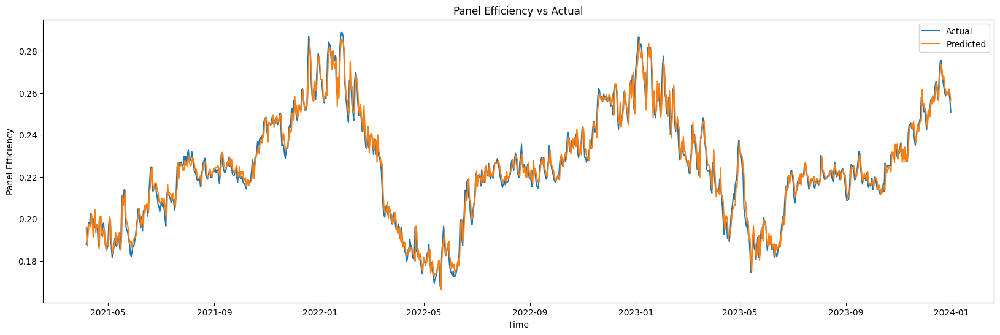

In [ ]:
# Plotting predicted and actual temperatures
plt.figure(figsize=(20, 6))
plt.plot(df_final.index[-1000:], true_eff[-1000:], label='Actual')
plt.plot(df_final.index[-1000:], predicted_eff[-1000:], label='Predicted')
plt.title('Panel Efficiency vs Actual')
plt.xlabel('Time')
plt.ylabel('Panel Efficiency')
plt.legend()
plt.show()

In [ ]:
#P=A×G×η
#Where:
#P is the power output in watts (W),
#A is the area of the solar panel in square meters (m²),
#G is the solar irradiance in watts per square meter (W/m²), which is the power of solar radiation per unit area (commonly taken as 1000 W/m² under Standard Test Conditions),
#η is the efficiency of the solar panel expressed as a decimal (for example, 15% efficiency would be 0.15).